In [4]:
using Pkg

using DataFrames

using CSV

using Plots

using Dates
 
using NetCDF

cd("C:\\Users\\panagiot\\.julia\\Particles")
Pkg.activate(".")

using Particles








Activating environment at `C:\Users\panagiot\.julia\Particles\Project.toml`


In [5]:

t=[]
push!(t,CSV.read("C:\\Users\\panagiot\\.julia\\Particles\\case_ais_channel\\East_Bound_combined_249420000.csv",header=2))
push!(t,CSV.read("C:\\Users\\panagiot\\.julia\\Particles\\case_ais_channel\\East_Bound_combined_256735000.csv",header=2))
push!(t,CSV.read("C:\\Users\\panagiot\\.julia\\Particles\\case_ais_channel\\East_Bound_combined_25903000.csv",header=2))
push!(t,CSV.read("C:\\Users\\panagiot\\.julia\\Particles\\case_ais_channel\\East_Bound_combined_229068000.csv",header=2))

4-element Array{Any,1}:
 4511×21 DataFrame. Omitted printing of 15 columns
│ Row  │ Date and UTC Time   │ Lat     │ Lon      │ SOG     │ HDG   │ COG     │
│      │ String              │ Float64 │ Float64  │ Float64 │ Int64 │ Float64 │
├──────┼─────────────────────┼─────────┼──────────┼─────────┼───────┼─────────┤
│ 1    │ 11/02/2019 23:22:05 │ 49.7488 │ -3.05692 │ 12.6    │ 66    │ 63.0    │
│ 2    │ 11/02/2019 23:22:15 │ 49.749  │ -3.05611 │ 12.6    │ 66    │ 63.3    │
│ 3    │ 11/02/2019 23:22:24 │ 49.7492 │ -3.05538 │ 12.6    │ 66    │ 63.4    │
│ 4    │ 11/02/2019 23:22:33 │ 49.7495 │ -3.05458 │ 12.6    │ 66    │ 63.6    │
│ 5    │ 11/02/2019 23:22:44 │ 49.7498 │ -3.0538  │ 12.6    │ 66    │ 63.9    │
│ 6    │ 11/02/2019 23:22:54 │ 49.75   │ -3.05301 │ 12.6    │ 66    │ 63.7    │
│ 7    │ 11/02/2019 23:23:05 │ 49.7503 │ -3.05212 │ 12.6    │ 66    │ 63.7    │
│ 8    │ 11/02/2019 23:23:15 │ 49.7506 │ -3.05129 │ 12.6    │ 66    │ 63.8    │
│ 9    │ 11/02/2019 23:23:24 │ 49.7508 │ -3.0

In [6]:
for ti=1:length(t)

   times=t[ti][1]

   ts=[DateTime(t,"dd/mm/yyyy HH:MM:SS") for t=times]

   t[ti].Times=ts

end

┌ Warning: `getindex(df::DataFrame, col_ind::ColumnIndex)` is deprecated, use `df[!, col_ind]` instead.
│   caller = top-level scope at In[6]:3
└ @ Core In[6]:3


In [4]:
shipnames=[]

for si=1:4

   push!(shipnames,t[si].Name[20])

end
 

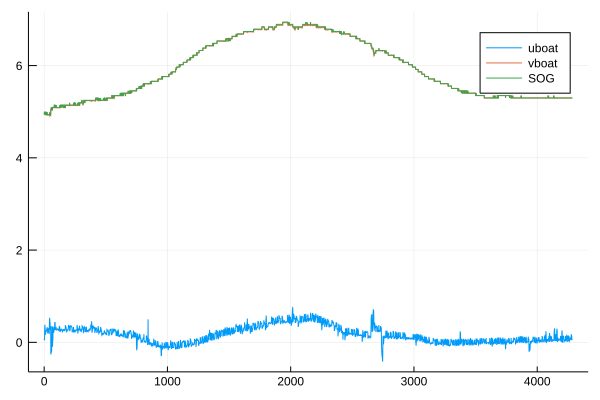

In [5]:
uboat=[]
vboat=[]


    
push!(uboat,sind.(t[4].COG-t[4].HDG).*(0.514444.*(t[4].SOG)))
push!(vboat,cosd.(t[4].COG-t[4].HDG).*(0.514444.*(t[4].SOG)))


plot(uboat,label="uboat")
plot!(vboat,label="vboat")
plot!(t[4].SOG*0.514444,label="SOG")





https://www.gebco.net/data_and_products/gebco_web_services/web_map_service/mapserv?height=1000&styles=default&format=image%2Fpng&SERVICE=WMS&VERSION=1.1.1&width=1000&REQUEST=GetMap&layers=GEBCO_LATEST&SRS=epsg%3A4326&bbox=-5.5%2C48.5%2C2.0%2C51.5
Cache folder .cache already exists
Cache file .cache\www.gebco.net_7141528106393586006.png already exists. Using cached file


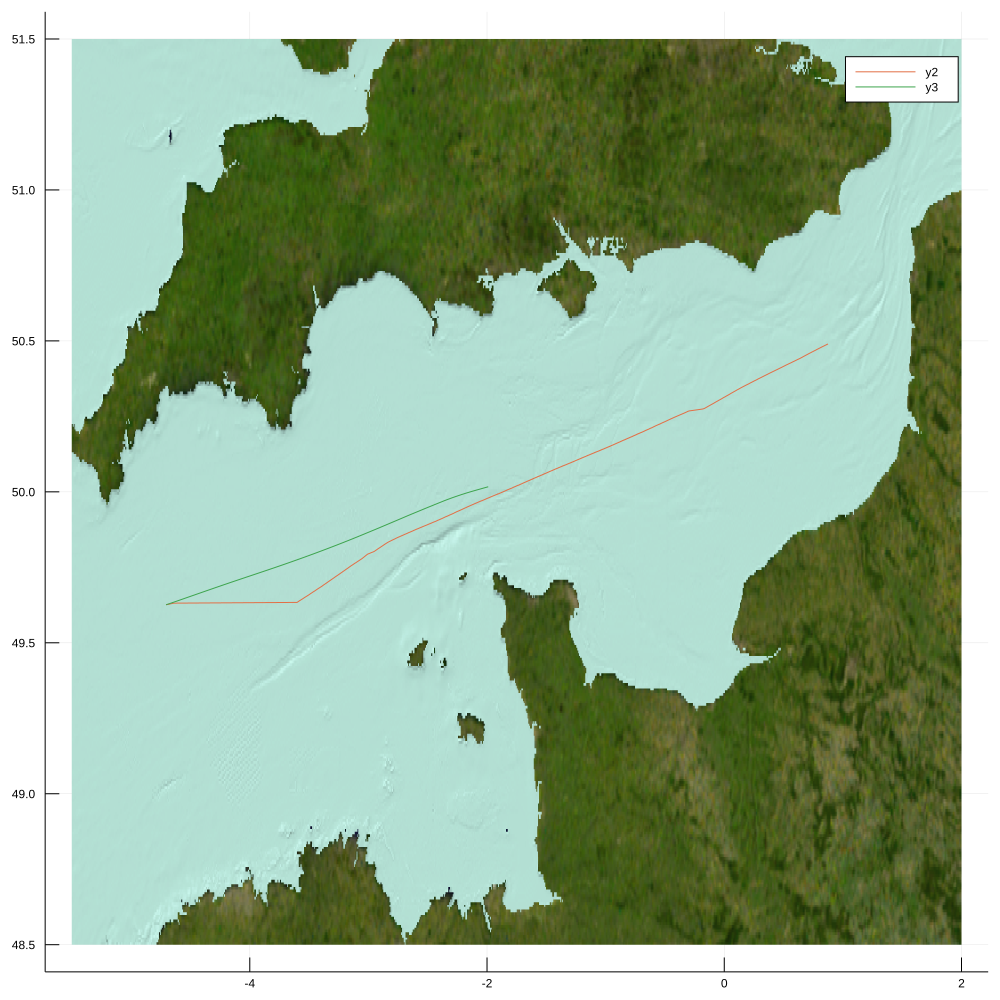

In [14]:

width=1000

height=1000

Plots.default(:size,[width,height])

gebco_server=WmsServer("gebco") #gebco or emodnet-bathymetry or open-streetmap

bbox=[-5.5,48.5,2,51.5]  #area to plot min(Lon), min(Lat), max(Lon), max(Lat)



img=get_map(gebco_server,bbox,width,height)



plot_image(img,bbox)



plot!(t[2].Lon,t[2].Lat)

#plot!(t[2].Lon,t[2].Lat)

#plot!(t[3].Lon,t[3].Lat)

#plot!(t[4].Lon,t[4].Lat)

plot!(phi,lamda)





In [10]:

ff=NetCDF.open("gtsm_fine_0002_map.nc")


##### NetCDF File #####

C:\Users\panagiot\.julia\Particles\gtsm_fine_0002_map.nc

##### Dimensions #####

Name                                                Length                    
--------------------------------------------------------------------------------
nNetNode                                            113754                    
nFlowElem                                           124997                    
time                                                UNLIMITED (242 currently) 
nFlowElemContourPts                                 4                         
nFlowLink                                           230516                    
nNetElem                                            124997                    
nNetLinkContourPts                                  4                         
nFlowElemMaxNode                                    4                         
nNetLink                                            238816                    
nNetLinkPts          

In [11]:
dflow_map=[ff]

1-element Array{NcFile,1}:
 
##### NetCDF File #####

C:\Users\panagiot\.julia\Particles\gtsm_fine_0002_map.nc

##### Dimensions #####

Name                                                Length                    
--------------------------------------------------------------------------------
nNetNode                                            113754                    
nFlowElem                                           124997                    
time                                                UNLIMITED (242 currently) 
nFlowElemContourPts                                 4                         
nFlowLink                                           230516                    
nNetElem                                            124997                    
nNetLinkContourPts                                  4                         
nFlowElemMaxNode                                    4                         
nNetLink                                            238816              

In [12]:

t0=get_reftime(dflow_map)
interp=load_dflow_grid(dflow_map,50,false)
u1,v1=initialize_interpolation(dflow_map,interp,t0)



compute index:
- C:\Users\panagiot\.julia\Particles\gtsm_fine_0002_map.nc
initialize caching for C:\Users\panagiot\.julia\Particles\gtsm_fine_0002_map.nc ...


(getfield(Particles, Symbol("#u#7")){Interpolator,Float64,Array{Any,1},getfield(Particles, Symbol("#update_cache#4")){Array{NcFile,1},Array{Any,1},Array{Float64,1},Array{Any,1},Array{Any,1}},getfield(Particles, Symbol("#weights#6")){Array{Float64,1}}}(Interpolator(Grid[Grid([-60.0, -30.0, -60.0, -30.0, -75.0, -60.0, -45.0, -30.0, -15.0, -30.0  …  -35.2734375, -29.6484375, -29.4140625, -31.7578125, -62.9296875, -29.6484375, -35.0390625, -61.5234375, -31.5234375, -35.2734375], [30.0, 30.0, 60.0, 60.0, 30.0, 45.0, 60.0, 45.0, 60.0, 15.0  …  53.5546875, 50.0390625, 50.0390625, 52.3828125, 33.8671875, 51.6796875, 53.5546875, 33.6328125, 52.1484375, 53.7890625], [36558 51452 73074 72879; 36948 51453 73074 51452; … ; 31335 70190 85858 64420; 31335 64420 80564 48134], Int64[], [-127.20703125, 139.27734375, -8.02734375, 76.69921875], [4, 4, 4, 4, 4, 4, 4, 4, 4, 4  …  4, 4, 4, 4, 4, 4, 4, 4, 4, 4], Grid[Grid([-60.0, -30.0, -60.0, -30.0, -75.0, -60.0, -45.0, -30.0, -15.0, -30.0  …  -35.2734375, -

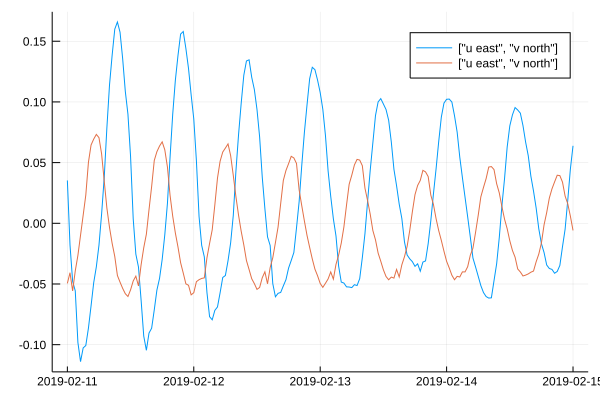

In [19]:
lon=-4.189453

lat=50.361324

ts=(14.0*24.0*3600.0):1800.0:(18.0*24.0*3600.0) #times in seconds since t0

tt=t0+ts.*Second(1) #convert to DateTime

uu=zeros(length(tt))

vv=zeros(length(tt))

for ti=1:length(tt)

  uu[ti]=u1(lon,lat,0.0,ts[ti])

  vv[ti]=v1(lon,lat,0.0,ts[ti])

end

plot(tt,[uu,vv],label=["u east","v north"])

In [170]:


utrack1=zeros(length(t[4].Times))

vtrack1=zeros(length(t[4].Times))

ttrack1=zeros(length(t[4].Times))

for ti=1:length(ttrack1)

   time=(t[4].Times[ti]-t0).value/1000#convert to seconds relative to t0

   #println("time=$(time) $(ti)")

   ttrack1[ti]=time

   utrack1[ti]=u1(t[4].Lon[ti],t[4].Lat[ti],0.0,ttrack1[ti])

   vtrack1[ti]=v1(t[4].Lon[ti],t[4].Lat[ti],0.0,ttrack1[ti])

end

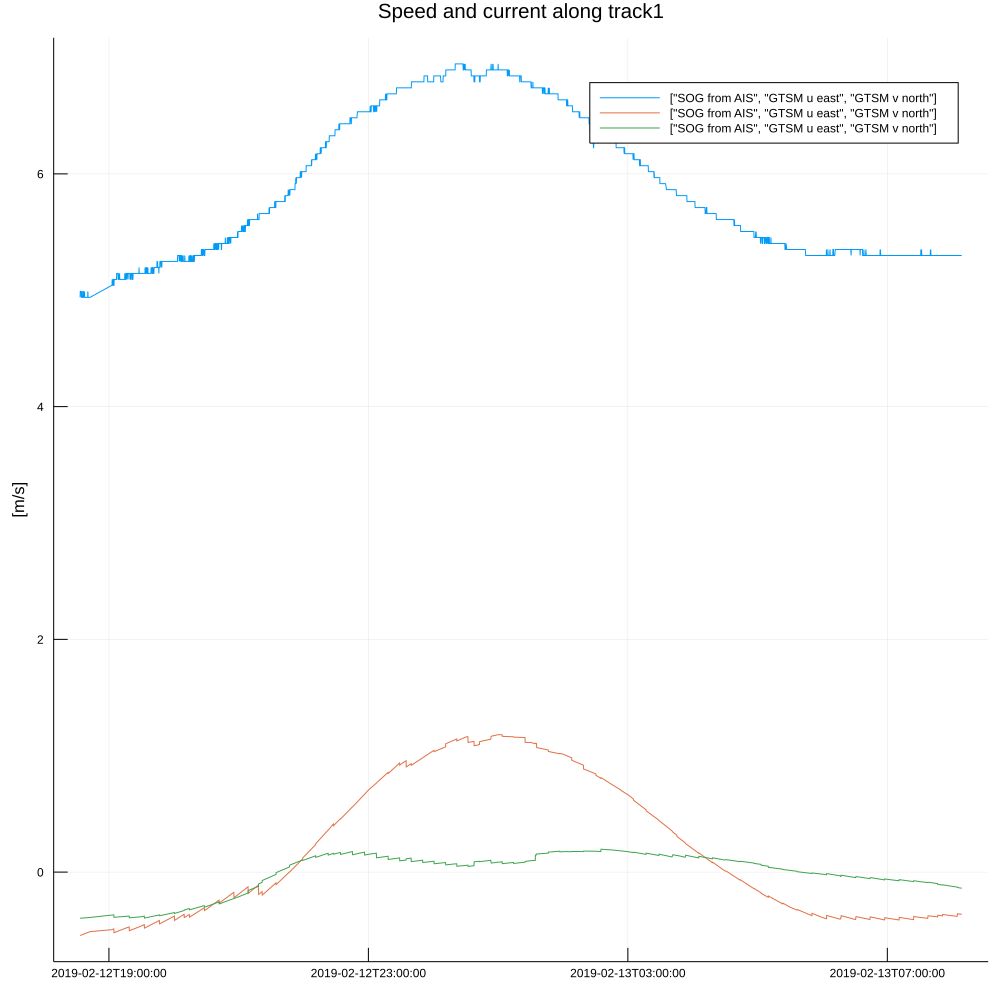

In [171]:
knots2ms=0.514444 #conversion of speed as knots to meters/second

#plot(t[1].Times,t[1].SOG*knots2ms)

plot(t[4].Times,[t[4].SOG*knots2ms,utrack1,vtrack1],label=["SOG from AIS","GTSM u east","GTSM v north"])

title!("Speed and current along track1")

ylabel!("[m/s]")

In [172]:
#Calculate the along current from the model data of the current
Calong=zeros(length(t[4].Times))
Ccross=zeros(length(t[4].Times))

for i=1:length(t[4].Times)

    Calong[i]=sind.(t[4].HDG[i]).*utrack1[i]+cosd.(t[4].HDG[i]).*vtrack1[i]
    Ccross[i]=cosd.(t[4].HDG[i]).*utrack1[i]-sind.(t[4].HDG[i]).*vtrack1[i]
    
end



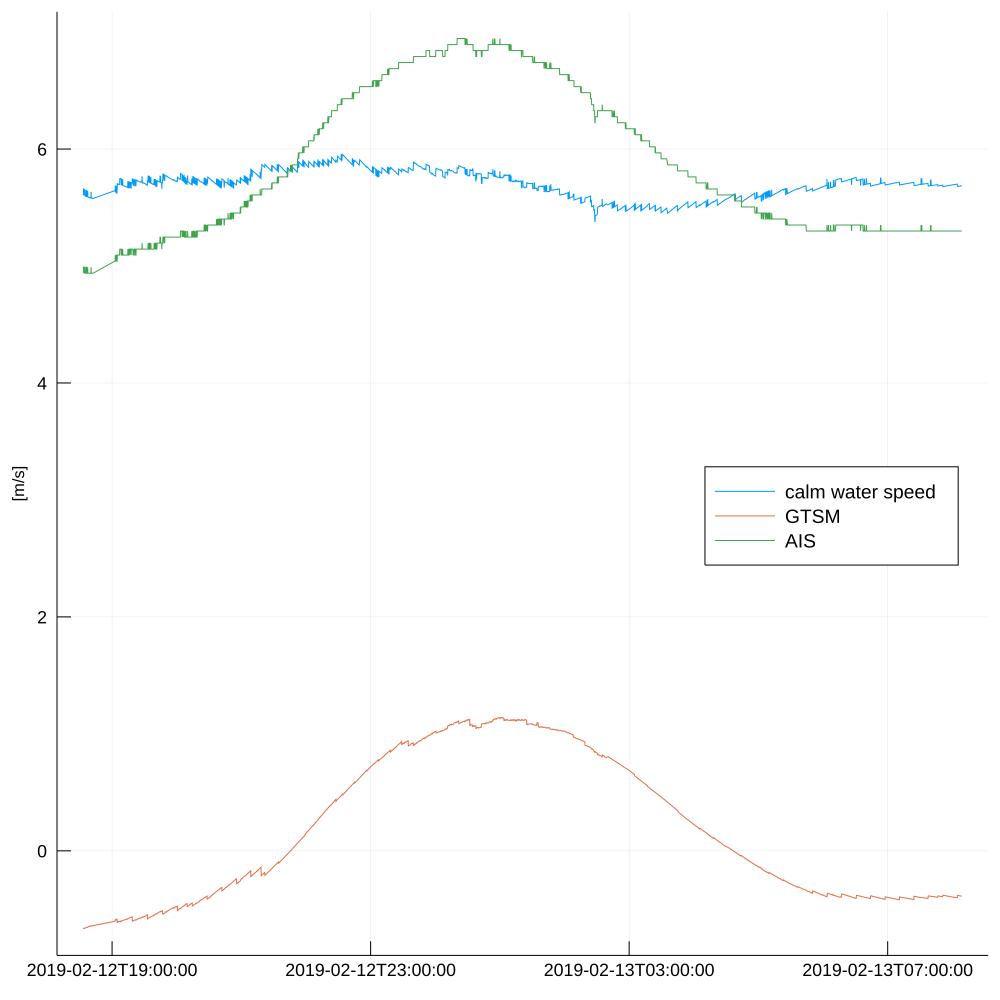

In [174]:
#Plot the calm water speed (speed of the ship in absence of currents SO),SOG,and the along current

plot(t[4].Times,t[4].SOG.*0.514444-Calong,label="calm water speed")
plot!(t[4].Times,Calong,label="GTSM",xtickfontsize=12,ytickfontsize=12)
plot!(t[4].Times,t[4].SOG.*0.514444,label="AIS",legend=:right,legendfontsize=13)
ylabel!("[m/s]")
 



In [ ]:
plot(t[4].Times,Ccross,label="GTSM",xtickfontsize=12,ytickfontsize=12,legendfontsize=13)
plot!(t[4].Times,uboat,label="AIS")

ylabel!("[m/s]")

savefig("crosscurrentprese.png")

In [ ]:
his=NetCDF.open("gtsm_fine_0000_his.nc")


In [ ]:
his1=[his]

In [ ]:
t0=get_reftime(his1)

In [ ]:
print(his1[1].vars["station_y_coordinate"][1234])
print(his1[1].vars["station_x_coordinate"][1234])

tk=(14.0*24.0*3600.0):600.0:(18.0*24.0*3600.0) #times in seconds since t0
th=t0+tk.*Second(1)
u=his1[1].vars["x_velocity"][1234,:]
time=his1[1].vars["time"][2593]
plot(th,u[2017:2593],label="Plymouth station")
plot!(tt,uu,label="model")

savefig("Model_stationPlymouth.png")


In [13]:
#Ship movement model-no noise

R=6371000 #Earth radius in meters

phi=zeros(length(t[2].Times))
phi[1]=t[2].Lon[1]

lamda=zeros(length(t[2].Times))
lamda[1]=t[2].Lat[1]

utrack1=zeros(length(t[2].Times))
vtrack1=zeros(length(t[2].Times))
ttrack1=zeros(length(t[2].Times))


for ti=1:length(ttrack1)-1

   time=(t[2].Times[ti]-t0).value/1000#convert to seconds relative to t0

   ttrack1[ti]=time

   utrack1[ti]=u1(phi[ti],lamda[ti],0.0,ttrack1[ti])

   vtrack1[ti]=v1(phi[ti],lamda[ti],0.0,ttrack1[ti])
    
   uship=((0.514444*t[2].SOG[1])*sind(t[2].COG[1])).-utrack1[1] 
   vship=((0.514444*t[2].SOG[1])*cosd(t[2].COG[1])).-vtrack1[1]
     
   #Calculate longitude

   phi[ti+1]=phi[ti].+(((uship.+utrack1[ti]).*180)./(R.*pi.*cos((phi[ti].*pi)./180)))*9.0

   #Calculate latitude
    
   lamda[ti+1]=lamda[ti].+(((vship.+vtrack1[ti]).*180)./(pi.*R)).*9.0

end







